### Correlaciones

En este Notebook vamos a analizar las relaciones entre las variables para la predicción del precio de la electricidad horario en España.

El periodo de predicción va a ser de 2020 a abril de 2021

In [41]:
import os
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from pmdarima.arima import ndiffs, nsdiffs
from datetime import datetime
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import seaborn as sns
from dateutil.relativedelta import relativedelta
from metricas import mae, mape, rmse
import plotly.graph_objects as go


import warnings
warnings.simplefilter("ignore")

# Mostramos las versiones de los módulos para posibles reproducciones del código

print('Versión pandas:', pd.__version__)
print('Versión numpy:', np.__version__)
print('Versión matplotlib:', matplotlib.__version__)
print('Version statsmodels', sm.__version__)

Versión pandas: 1.0.5
Versión numpy: 1.19.5
Versión matplotlib: 3.2.2
Version statsmodels 0.12.2


### Lectura del dataframe horario

In [42]:
# Lectura de los dataframes
df1 = pd.read_csv('Data/datos_horarios_prediccion_electricidad.csv', index_col = 0)
df2 = pd.read_csv('Data/datos_climatologicos.csv', index_col = 0)

# Conversión del índice a fecha
df1.index = pd.to_datetime(df1.index)
df2.index = pd.to_datetime(df2.index)

# Los valores climatológicos son spot, así que hay que moverlas 24 horas para ajustarlas a la predicción
df2 = df2.shift(24)

# Unión del dataframe único
df = df1.reset_index().merge(df2.reset_index(),
                       on = 'Fecha',
                       how = 'outer').set_index('Fecha')

df.to_csv('Data/dataframe.csv')

In [3]:
db = df.dropna().copy()

### Análisis variable objetivo

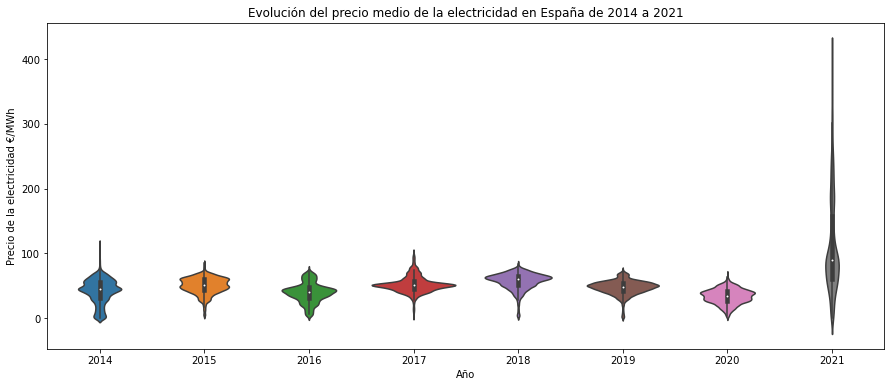

In [4]:
plt.figure(figsize = (15,6))
sns.violinplot(x = df.Spot_electricidad.index.year, y = df.Spot_electricidad)
plt.ylabel('Precio de la electricidad €/MWh')
plt.xlabel('Año')
plt.title('Evolución del precio medio de la electricidad en España de 2014 a 2021')
plt.show()

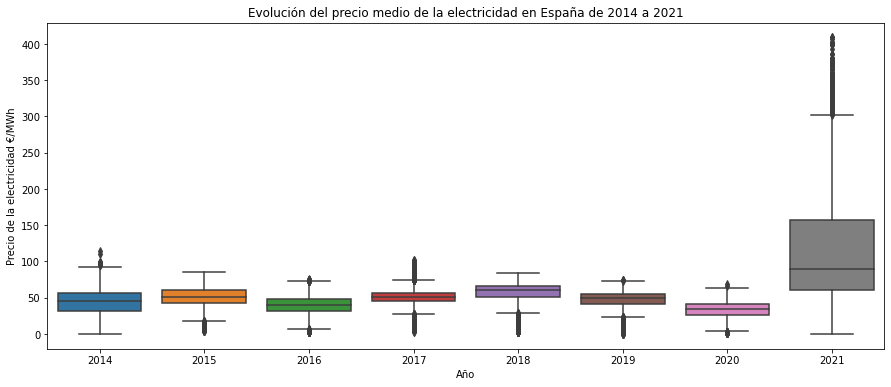

In [5]:
plt.figure(figsize = (15,6))
sns.boxplot(x = df.Spot_electricidad.index.year, y = df.Spot_electricidad)
plt.ylabel('Precio de la electricidad €/MWh')
plt.xlabel('Año')
plt.title('Evolución del precio medio de la electricidad en España de 2014 a 2021')
plt.show()

In [36]:
db.columns

Index(['Spot_electricidad', 'Prevision_Demanda', 'Prevision_Eol_Fotov',
       'Hueco_Termico', 'Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes',
       'Sabado', 'Hora_1', 'Hora_2', 'Hora_3', 'Hora_4', 'Hora_5', 'Hora_6',
       'Hora_7', 'Hora_8', 'Hora_9', 'Hora_10', 'Hora_11', 'Hora_12',
       'Hora_13', 'Hora_14', 'Hora_15', 'Hora_16', 'Hora_17', 'Hora_18',
       'Hora_19', 'Hora_20', 'Hora_21', 'Hora_22', 'Hora_23',
       'Festivo_Nacional', 'Festivo_Regional', 'MIBGAS_FW1D', 'Precio_max',
       'Precio_min', 'Spred_precio', 'Temperatura', 'Humedad_Relativa',
       'Precipitacion', 'Radiacion', 'Velocidad_Viento', 'Temperatura_max',
       'Temperatura_min', 'Spred_temperatura', 'Brent', 'Api2', 'IBEX', 'Año'],
      dtype='object')

In [37]:
# Columnas para calcular las correlaciones

cols_cor = ["Spot_electricidad","Spred_precio", "Prevision_Demanda", "Prevision_Eol_Fotov", "Hueco_Termico", "Temperatura", "Precipitacion",
     "Radiacion","Festivo_Nacional", "MIBGAS_FW1D", "IBEX", "Api2", "Brent"]

cols_1 = ["Spot_electricidad", "Prevision_Demanda", "Prevision_Eol_Fotov", "Hueco_Termico", "Spred_precio","Año"]
cols_2 = ["Spot_electricidad", "Temperatura", "Spred_temperatura" ,"Precipitacion", "Radiacion", "Velocidad_Viento","Año"]
cols_3 = ["Spot_electricidad", "MIBGAS_FW1D", "Api2", "Brent","IBEX","Año"]

db.loc[:, "Año"] = db.index.year

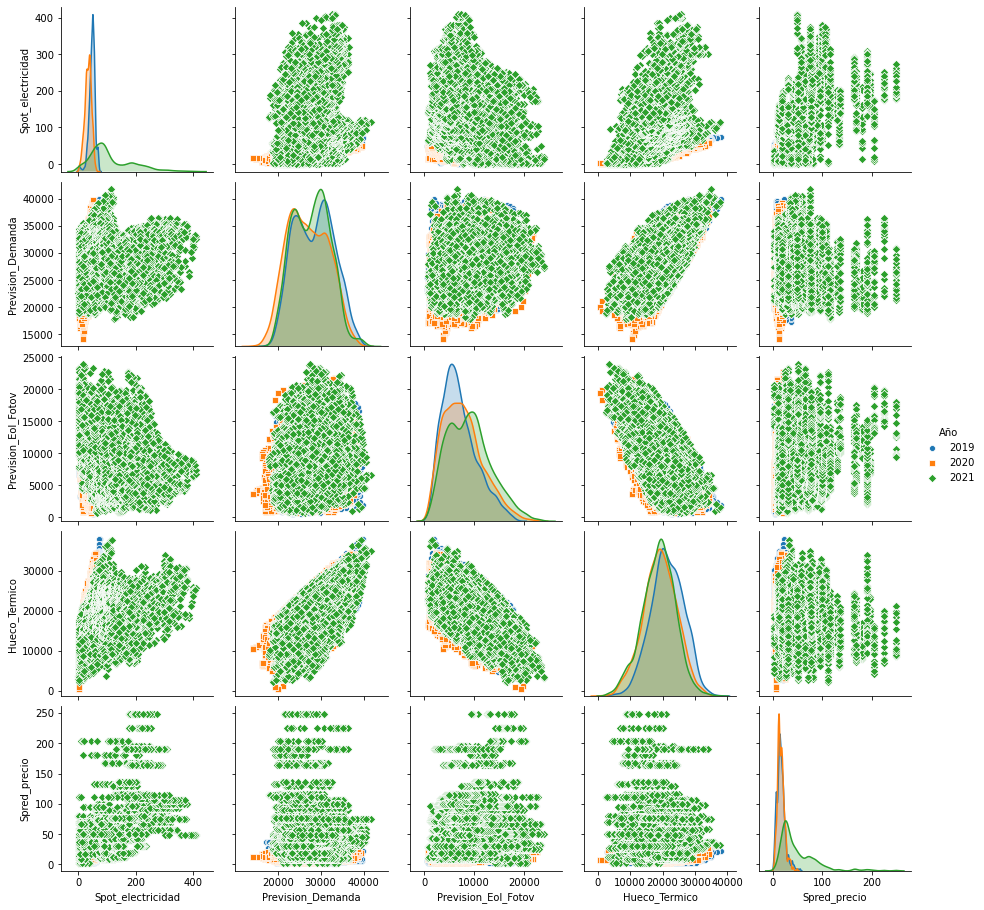

In [18]:
sns.pairplot(db[cols_1], hue = 'Año', markers=["o", "s", "D"])

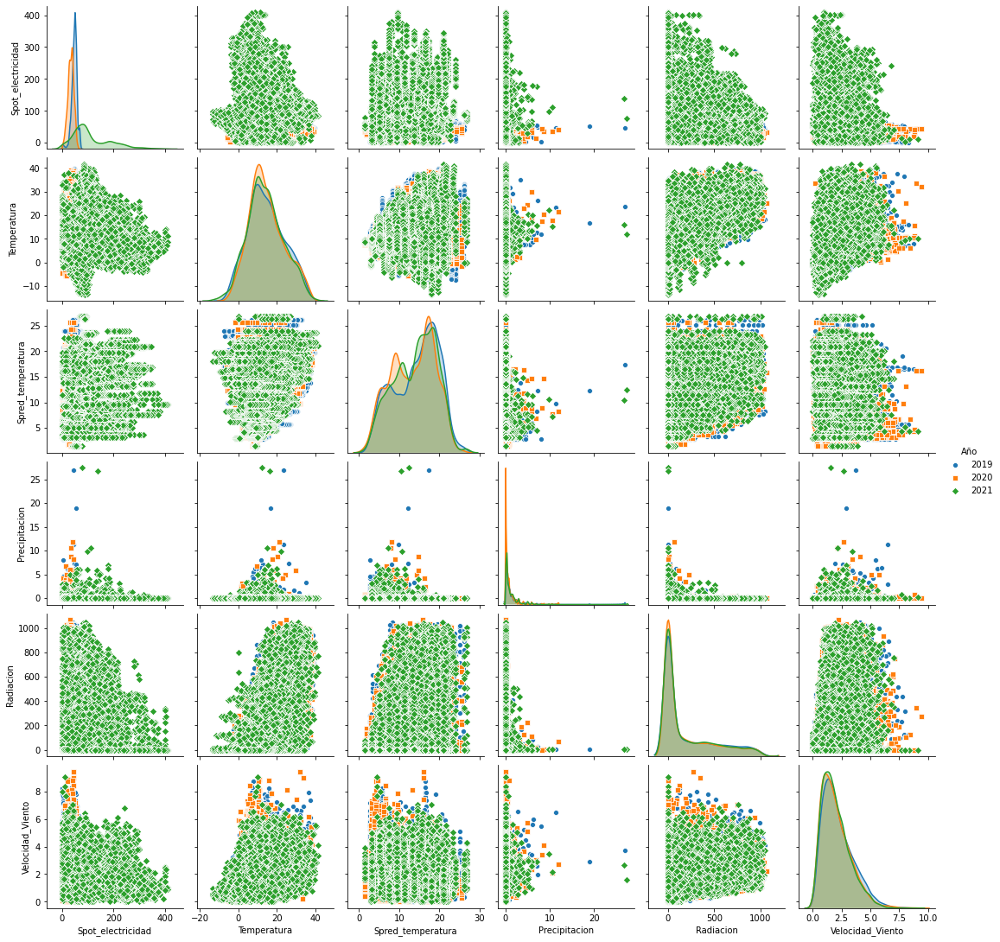

In [23]:
sns.pairplot(db[cols_2], hue = 'Año', markers=["o", "s", "D"])

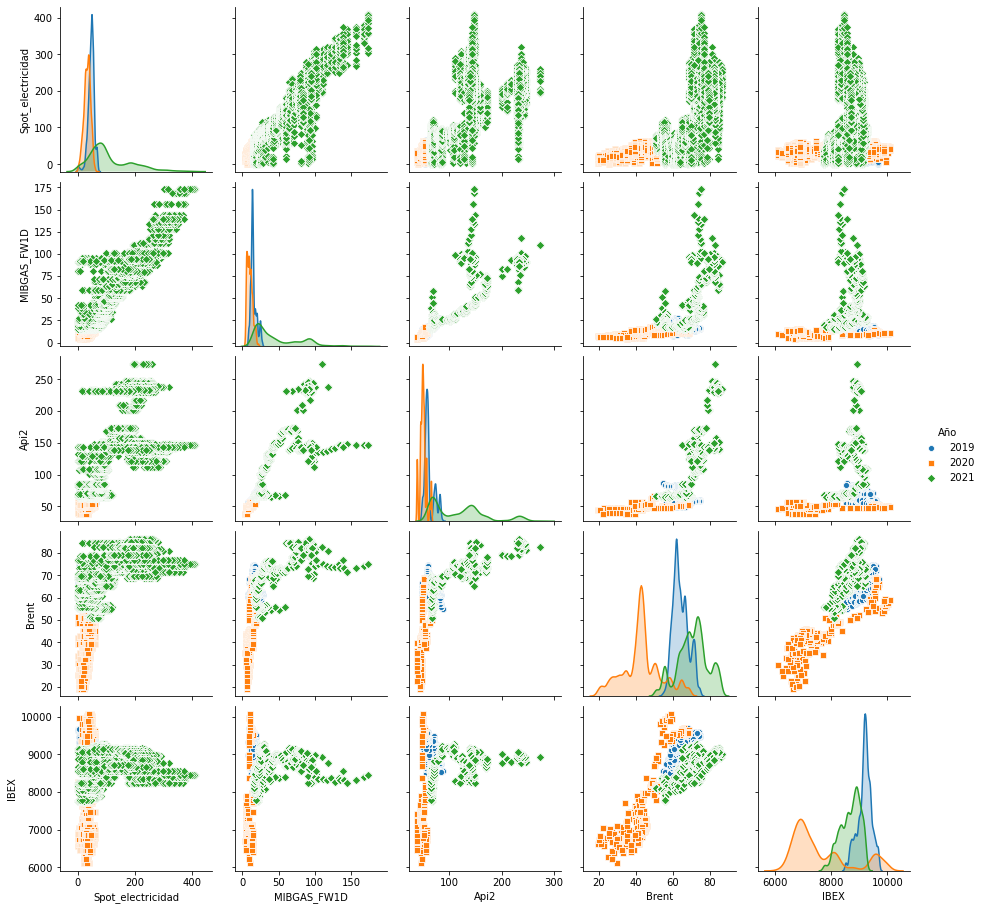

In [31]:
sns.pairplot(db[cols_3], hue = 'Año', markers=["o", "s", "D"])

### Correlaciones con todos los datos

### Correlaciones en 2019

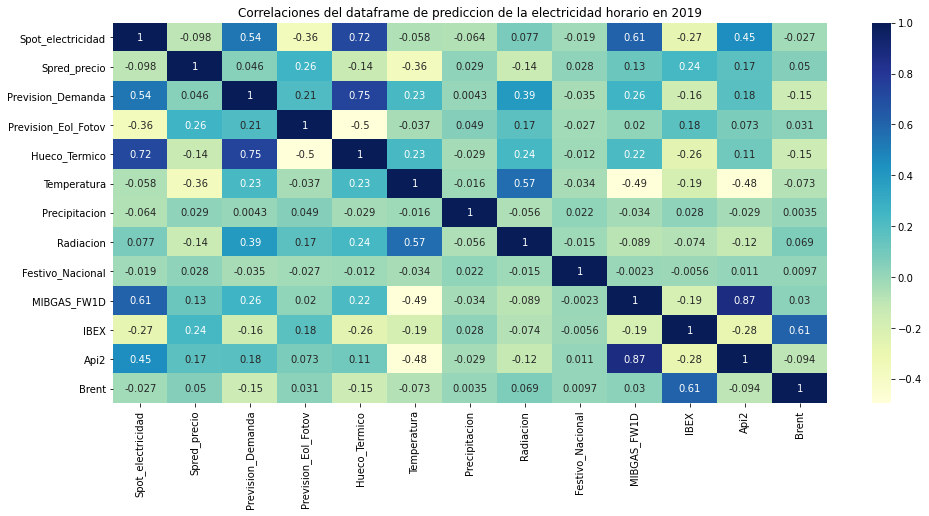

In [38]:
plt.figure(figsize = (16,7))
ax = sns.heatmap(db[cols_cor].loc["2019"].corr(), annot=True,  cmap="YlGnBu")
plt.title('Correlaciones del dataframe de prediccion de la electricidad horario en 2019')
plt.show()

### Correlaciones en 2020 

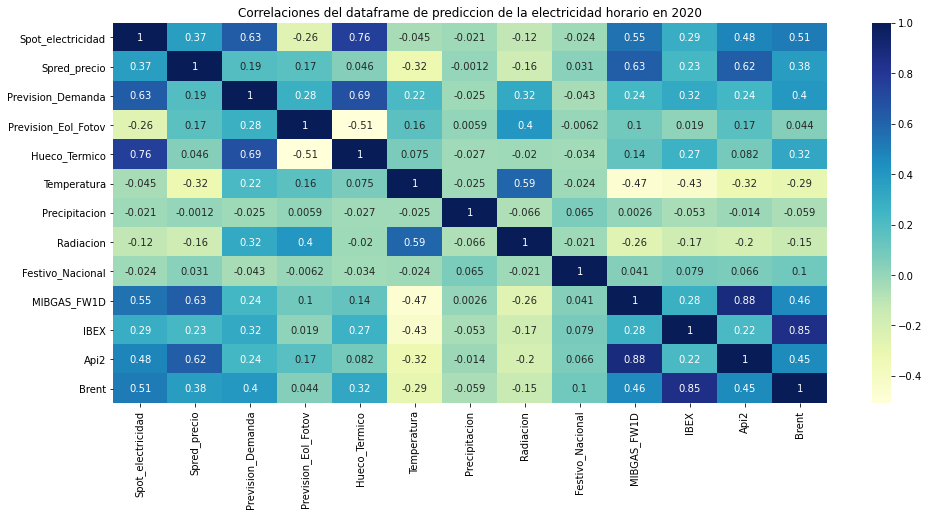

In [39]:
plt.figure(figsize = (16,7))
ax = sns.heatmap(df[cols_cor].loc["2020"].corr(), annot=True,  cmap="YlGnBu")
plt.title('Correlaciones del dataframe de prediccion de la electricidad horario en 2020')
plt.show()

### Correlaciones en 2021

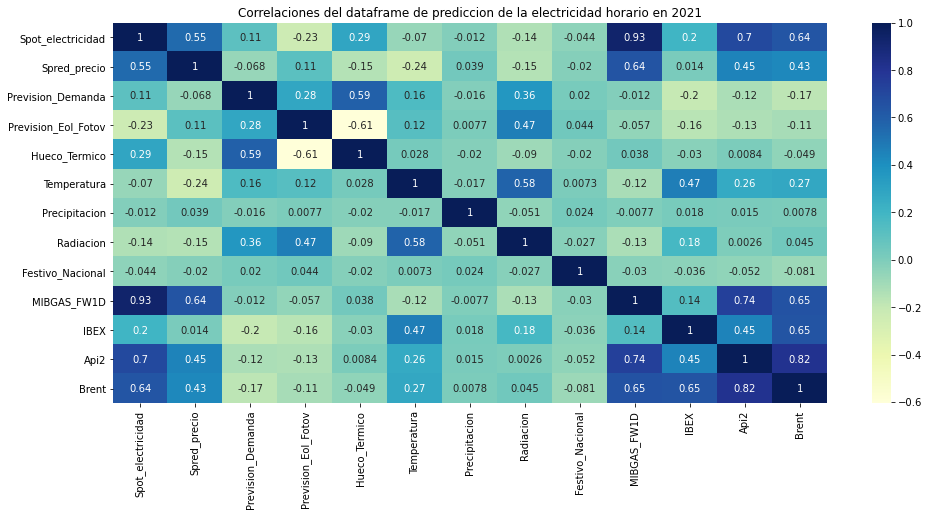

In [40]:
plt.figure(figsize = (16,7))
ax = sns.heatmap(df[cols_cor].loc["2021"].corr(), annot=True,  cmap="YlGnBu")
plt.title('Correlaciones del dataframe de prediccion de la electricidad horario en 2021')
plt.show()

### Estudio de la serie del precio de la electricidad

In [7]:
time_series = df.Spot_electricidad.copy()
time_series = time_series.loc[:]
fig = go.Figure()
fig.add_trace(go.Scatter(x= time_series.index.tolist(),y=time_series,
                    mode='lines',
                    name='Real'))

fig.show()

Diferencia regular: 0
Diferencia estacional: 0


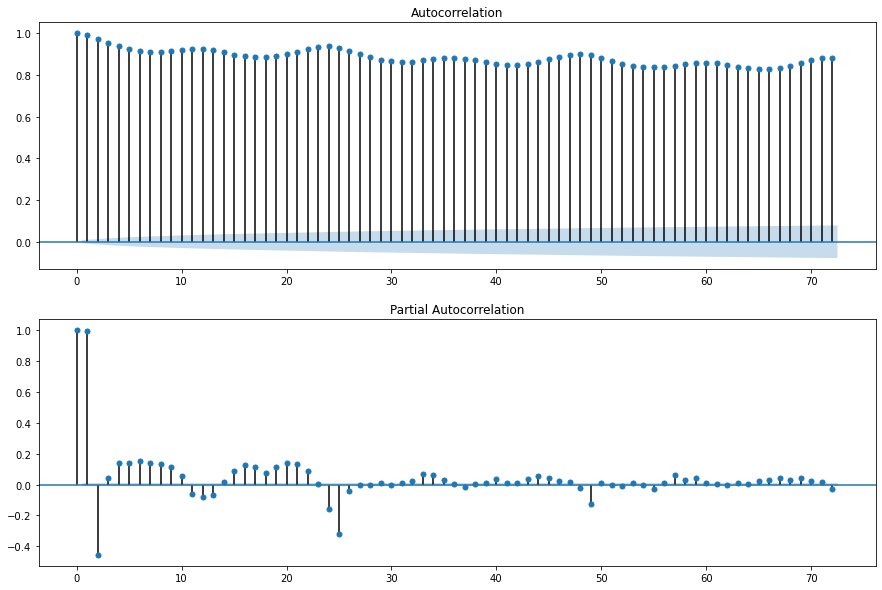

In [6]:
y = df.Spot_electricidad.loc["2021"].copy()

print('Diferencia regular:', ndiffs(y, alpha = 0.05, test = 'adf'))
print('Diferencia estacional:', nsdiffs(y, m = 24, test = 'ocsb'))

nlags = 72 # play with this parameter

fig, ax = plt.subplots(2,1, figsize = (15,10))
plot_acf(y, lags = nlags,  ax=ax[0])
plot_pacf(y, lags = nlags, method="ols",ax=ax[1])
plt.show()

Diferencia regular: 0
Diferencia estacional: 0


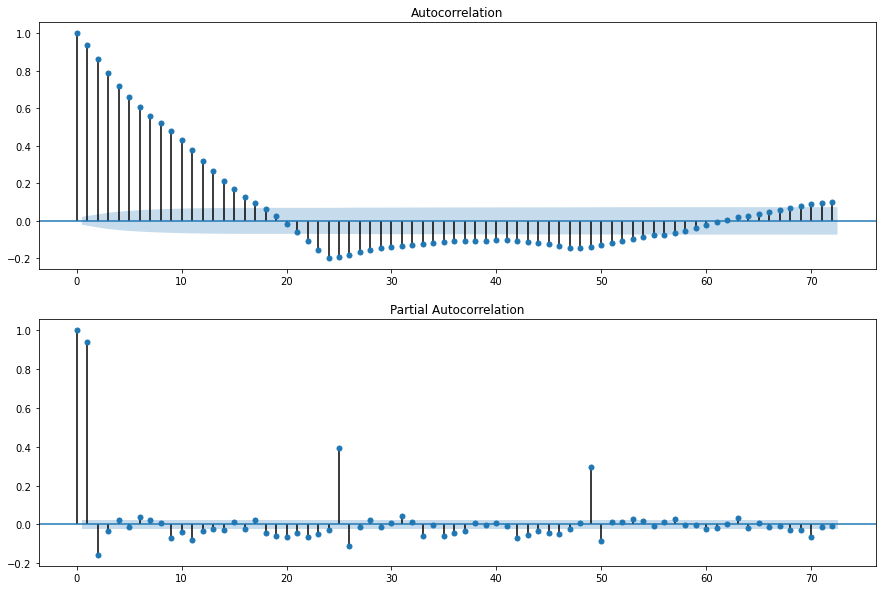

In [9]:
# No piden diferencias estacionales ni regulares ni los residuos ni la serie diaria

y = df.Spot_electricidad.loc["2021"].copy()
y = y.diff(24).dropna()

print('Diferencia regular:', ndiffs(y, alpha = 0.05, test = 'adf'))
print('Diferencia estacional:', nsdiffs(y, m = 24, test = 'ocsb'))

nlags = 72 # play with this parameter

fig, ax = plt.subplots(2,1, figsize = (15,10))
plot_acf(y, lags = nlags,  ax=ax[0])
plot_pacf(y, lags = nlags, method="ols",ax=ax[1])
plt.show()